In [ ]:
tensorflow_version 1.x

TensorFlow 1.x selected.


In [ ]:
!pip uninstall h5py -y
!pip install h5py==2.10 

Uninstalling h5py-3.1.0:
  Successfully uninstalled h5py-3.1.0
     |████████████████████████████████| 2.9MB 7.4MB/s 


In [ ]:
import tensorflow as tf
print(tf.__version__)
import h5py
print(h5py.__version__) 

1.15.2
2.10.0


In [ ]:
%cd /content/
# !git clone https://github.com/matterport/Mask_RCNN.git
!cp /content/drive/MyDrive/Items/Mask_RCNN ./ -r
%cd Mask_RCNN/
!pip3 install -r requirements.txt
!python3 setup.py install
!wget https://github.com/matterport/Mask_RCNN/releases/download/v2.0/mask_rcnn_coco.h5

/content
/content/Mask_RCNN
     |████████████████████████████████| 163kB 10.5MB/s 
     |████████████████████████████████| 204kB 36.3MB/s 
  Created wheel for gast: filename=gast-0.2.2-cp37-none-any.whl size=7540 sha256=bd997a22a5c0b460faed1845d94f8b9474703c557f4b315d9602da268772c614
  Stored in directory: /root/.cache/pip/wheels/5c/2e/7e/a1d4d4fcebe6c381f378ce7743a3ced3699feb89bcfbdadadd
Successfully built gast
ERROR: kapre 0.3.5 has requirement tensorflow>=2.0.0, but you'll have tensorflow 1.15.2 which is incompatible.
  Found existing installation: gast 0.4.0
    Uninstalling gast-0.4.0:
      Successfully uninstalled gast-0.4.0
/usr/local/lib/python3.7/dist-packages/setuptools/dist.py:672: UserWarning: Usage of dash-separated 'description-file' will not be supported in future versions. Please use the underscore name 'description_file' instead
  % (opt, underscore_opt))
/usr/local/lib/python3.7/dist-packages/setuptools/dist.py:672: UserWarning: Usage of dash-separated 'license-file


Mask R-CNN Demo

A quick intro to using the pre-trained model to detect and segment objects.

In [ ]:
import os
import sys
import random
import math
import pickle
import numpy as np
import skimage.io
import matplotlib
import matplotlib.pyplot as plt

# Root directory of the project
ROOT_DIR = os.path.abspath("/content/Mask_RCNN")

# Import Mask RCNN
sys.path.append(ROOT_DIR)  # To find local version of the library
from mrcnn import utils
import mrcnn.model as modellib
from mrcnn import visualize
# Import COCO config
sys.path.append(os.path.join(ROOT_DIR, "samples/coco/"))  # To find local version
import coco

%matplotlib inline 

# Directory to save logs and trained model
MODEL_DIR = os.path.join(ROOT_DIR, "logs")

# Local path to trained weights file
COCO_MODEL_PATH = os.path.join(ROOT_DIR, "mask_rcnn_coco.h5")
# Download COCO trained weights from Releases if needed
if not os.path.exists(COCO_MODEL_PATH):
    utils.download_trained_weights(COCO_MODEL_PATH)

# Directory of images to run detection on
IMAGE_DIR = os.path.join(ROOT_DIR, "images")

Using TensorFlow backend.


In [ ]:
class InferenceConfig(coco.CocoConfig):
    # Set batch size to 1 since we'll be running inference on
    # one image at a time. Batch size = GPU_COUNT * IMAGES_PER_GPU
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1

config = InferenceConfig()
# config.display()

# Create model object in inference mode.
model = modellib.MaskRCNN(mode="inference", model_dir=MODEL_DIR, config=config)

# Load weights trained on MS-COCO
model.load_weights(COCO_MODEL_PATH, by_name=True)

class_names = ['BG', 'person', 'bicycle', 'car', 'motorcycle', 'airplane',
               'bus', 'train', 'truck', 'boat', 'traffic light',
               'fire hydrant', 'stop sign', 'parking meter', 'bench', 'bird',
               'cat', 'dog', 'horse', 'sheep', 'cow', 'elephant', 'bear',
               'zebra', 'giraffe', 'backpack', 'umbrella', 'handbag', 'tie',
               'suitcase', 'frisbee', 'skis', 'snowboard', 'sports ball',
               'kite', 'baseball bat', 'baseball glove', 'skateboard',
               'surfboard', 'tennis racket', 'bottle', 'wine glass', 'cup',
               'fork', 'knife', 'spoon', 'bowl', 'banana', 'apple',
               'sandwich', 'orange', 'broccoli', 'carrot', 'hot dog', 'pizza',
               'donut', 'cake', 'chair', 'couch', 'potted plant', 'bed',
               'dining table', 'toilet', 'tv', 'laptop', 'mouse', 'remote',
               'keyboard', 'cell phone', 'microwave', 'oven', 'toaster',
               'sink', 'refrigerator', 'book', 'clock', 'vase', 'scissors',
               'teddy bear', 'hair drier', 'toothbrush']

Instructions for updating:
If using Keras pass *_constraint arguments to layers.


Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where
Instructions for updating:
box_ind is deprecated, use box_indices instead


Instructions for updating:
Use `tf.cast` instead.


In [ ]:
import cv2
# Load a random image from the images folder
file_names = next(os.walk(IMAGE_DIR))[2]
image = skimage.io.imread(os.path.join(IMAGE_DIR, random.choice(file_names)))

image = skimage.io.imread("/content/images/example30.jpg")
# Run detection
results = model.detect([image], verbose=1)
xy = np.loadtxt('/content/AoA_position_校准后.csv', delimiter=',')
xy = xy.astype(int)
for item in xy:
    cv2.drawMarker(image, (item[0], item[1]), (255, 0, 0), markerType=cv2.MARKER_STAR,
                    markerSize=40, thickness=2, line_type=cv2.LINE_AA)

# Visualize results
r = results[0]
visualize.display_instances(image, r['rois'], r['masks'], r['class_ids'], 
                            class_names, r['scores'])
plt.savefig("test.jpg")

In [ ]:
data_dir = "/content/images"
for i in os.listdir(data_dir):  
  print(os.path.join(data_dir,i))
  image = skimage.io.imread(os.path.join(data_dir,i))
  results = model.detect([image], verbose=1)
  r = results[0]
  visualize.display_instances(image, r['rois'], r['masks'], r['class_ids'], 
                              class_names, r['scores'])
  # with open(i+".pkl","wb") as fw:
  #   pickle.dump(results,fw)


In [ ]:
import cv2
data_dir = "/content/images"
for i in os.listdir(data_dir):  
  print(os.path.join(data_dir,i))
  if(i.split('.')[-1]!='jpg'):
    break
  image = skimage.io.imread(os.path.join(data_dir,i))
  results = model.detect([image], verbose=1)
  r = results[0]
  visualize.display_instances(image, r['rois'], r['masks'], r['class_ids'], class_names, r['scores'])
  masks = r['masks']
  for j in range(len(r['class_ids'])):
    if class_names[r['class_ids'][j]]=='bottle':
      answer = np.where(masks[:,:,j])
      answer = np.array(answer)
      file_name = "answer/"+i.split('.')[0]+"_"+str(r['scores'][j])+".csv"
      np.savetxt(file_name, answer.T, delimiter=",",fmt="%d")


In [ ]:
def dye_mask(img1, results, positions, output='img_seg.jpg'):
  import cv2
  masks = results[0]["masks"]
  scores = results[0]["scores"]
  num_objects = len(scores)
  final_score = np.zeros(num_objects)
  for i in range(num_objects):
      mask = masks[:, :, i]
      count = 0
      size = np.where(mask)[0].shape[0]
      for x, y in positions:
          if mask[y, x]:
              count += 1
      final_score[i] = count / size * scores[i]
  k = np.argmax(final_score)
  mask = masks[:, :, k]
  mask = np.where(mask, 255, 0).astype("uint8")
  mask = np.expand_dims(mask, axis=2)
  img0 = np.zeros(mask.shape).astype("uint8")
  mask = np.concatenate((img0, mask, img0), axis=-1)
  img4 = cv2.addWeighted(img1, 1, mask, 1, 0)
  cv2.imwrite(output, img4)

def draw_mask(img_dir, AoA_dir, all_dir, final_dir, data_dir):
  image = skimage.io.imread(img_dir)
  positions = np.loadtxt(AoA_dir, delimiter=',').astype(int)
  import cv2
  img1 = cv2.imread(img_dir)
  print(image.shape)
  print(img1.shape)
  results = model.detect([image], verbose=1)
  r = results[0]
  visualize.display_instances(image, r['rois'], r['masks'], r['class_ids'], class_names, r['scores'], output_file=all_dir)
  masks = r["masks"]
  scores = r["scores"]
  num_objects = len(scores)
  final_score = np.zeros(num_objects)
  now_masks = []
  for i in range(num_objects):
      mask = masks[:, :, i]
      count = 0
      size = np.where(mask)[0].shape[0]
      for x, y in positions:
          if(x>=4032)or(x<0):
            continue
          if(y>=3024)or(y<0):
            continue
          if mask[y, x]:
              count += 1
      final_score[i] = count / size * scores[i]
      now_masks.append(mask)
  k = np.argmax(final_score)
  mask = masks[:, :, k]
  r["final_mask"] = mask
  mask = np.where(mask, 255, 0).astype("uint8")
  mask = np.expand_dims(mask, axis=2)
  img0 = np.zeros(mask.shape).astype("uint8")
  mask = np.concatenate((img0, mask, img0), axis=-1)
  img4 = cv2.addWeighted(img1, 1, mask, 1, 0)
  cv2.imwrite(final_dir, img4)
  r["masks"] = now_masks
  r["final_score"] = final_score
  import pickle
  fr = open(data_dir,"wb")
  pickle.dump(r,fr)

In [ ]:
!cp /content/drive/MyDrive/data/Vision_performance/ -r /content/

In [ ]:
!rm -rf /content/Vision_performance/

(3024, 4032, 3)
(3024, 4032, 3)
Processing 1 images
image                    shape: (3024, 4032, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 93)               min:    0.00000  max: 4032.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


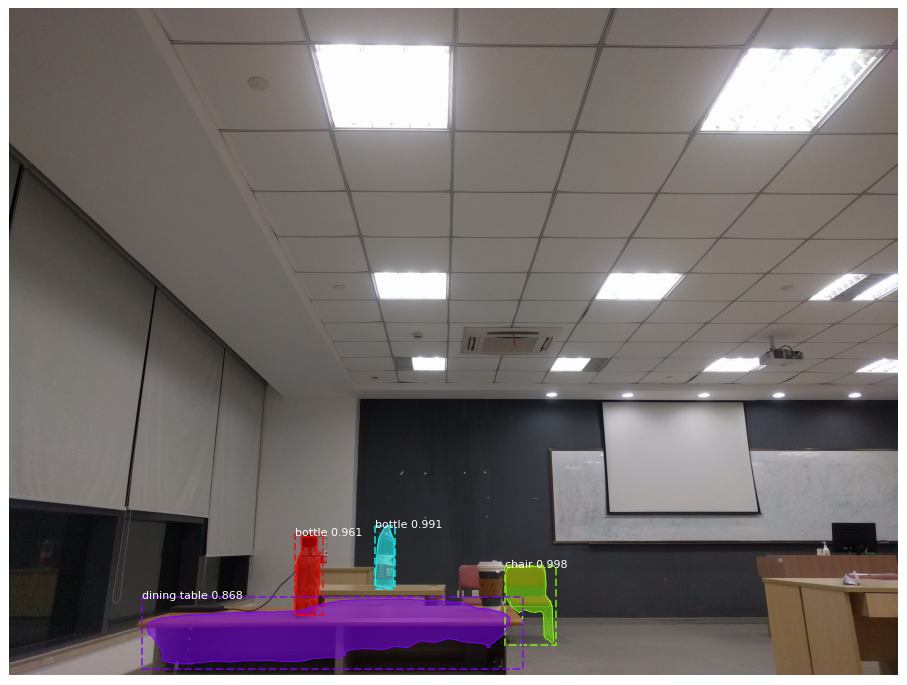

(3024, 4032, 3)
(3024, 4032, 3)
Processing 1 images
image                    shape: (3024, 4032, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 93)               min:    0.00000  max: 4032.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


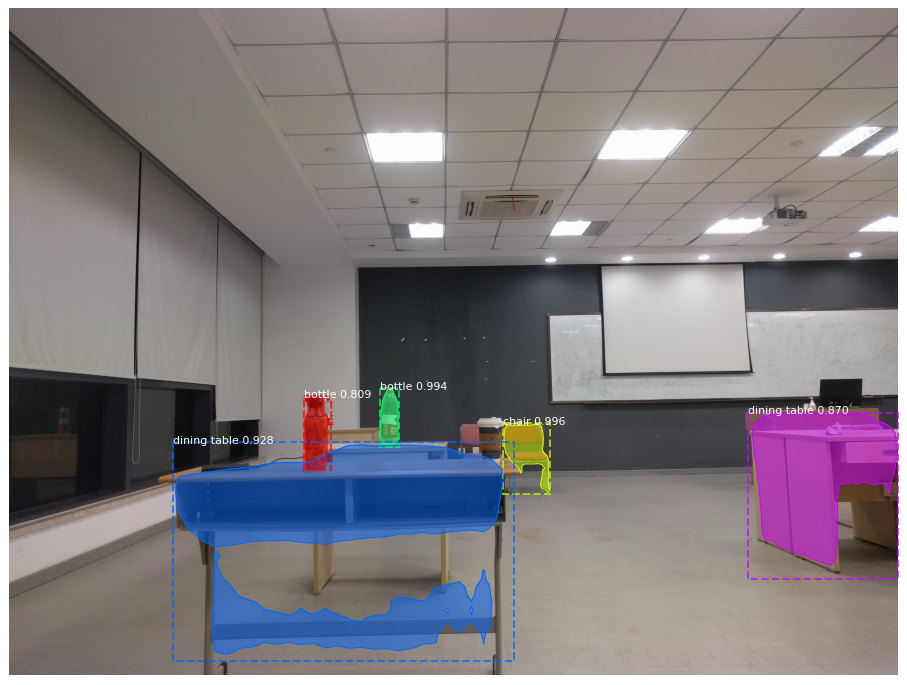

(3024, 4032, 3)
(3024, 4032, 3)
Processing 1 images
image                    shape: (3024, 4032, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 93)               min:    0.00000  max: 4032.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


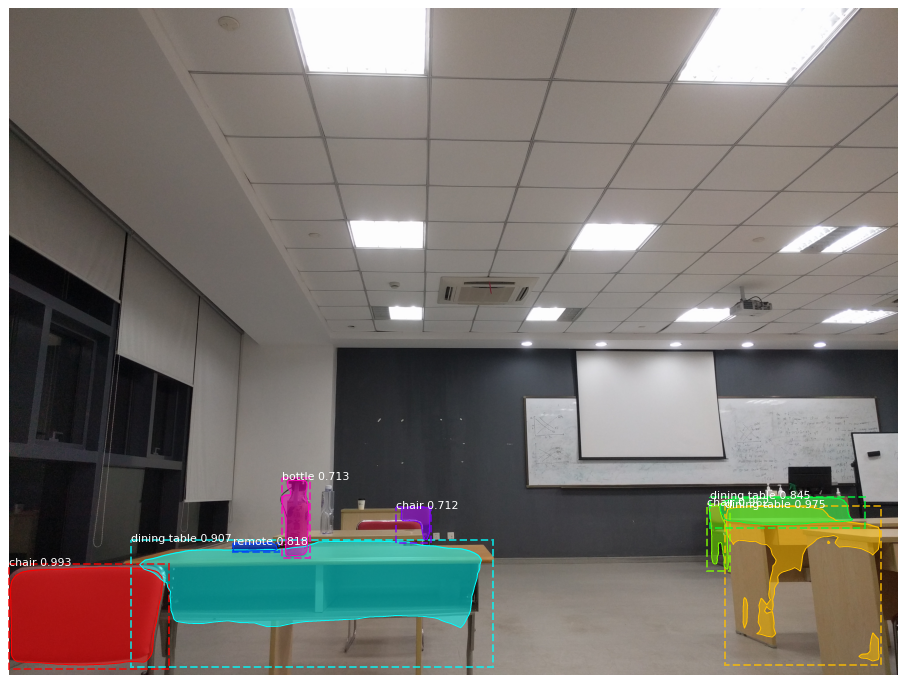

(3024, 4032, 3)
(3024, 4032, 3)
Processing 1 images
image                    shape: (3024, 4032, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 93)               min:    0.00000  max: 4032.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


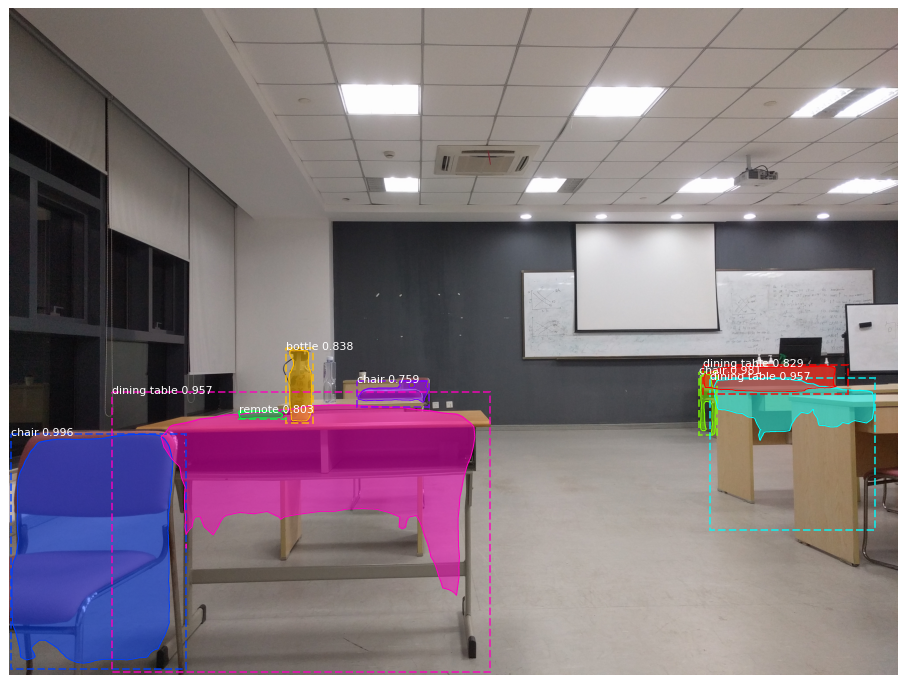

(3024, 4032, 3)
(3024, 4032, 3)
Processing 1 images
image                    shape: (3024, 4032, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 93)               min:    0.00000  max: 4032.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


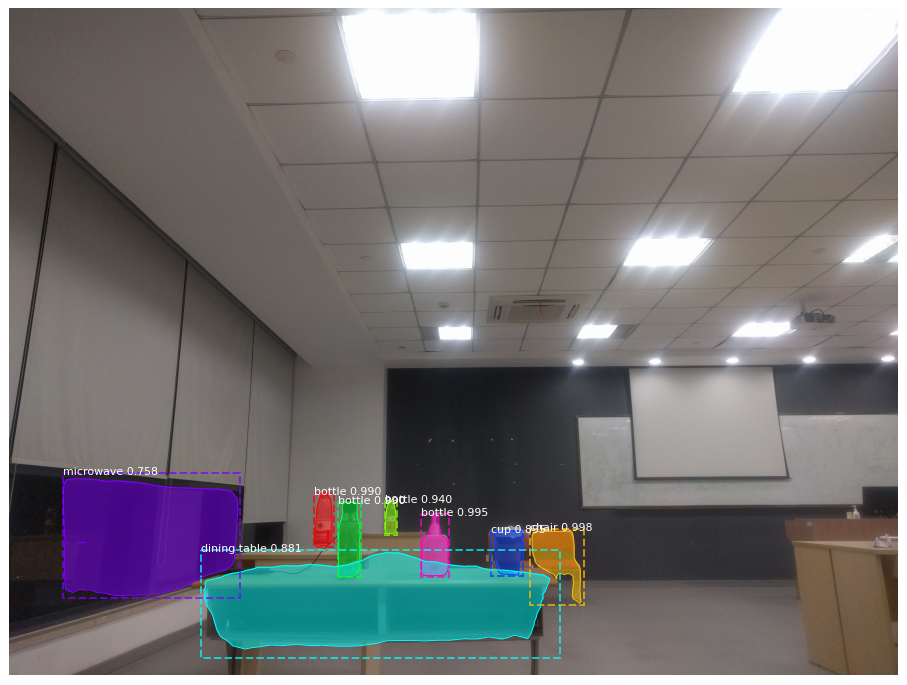

(3024, 4032, 3)
(3024, 4032, 3)
Processing 1 images
image                    shape: (3024, 4032, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 93)               min:    0.00000  max: 4032.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


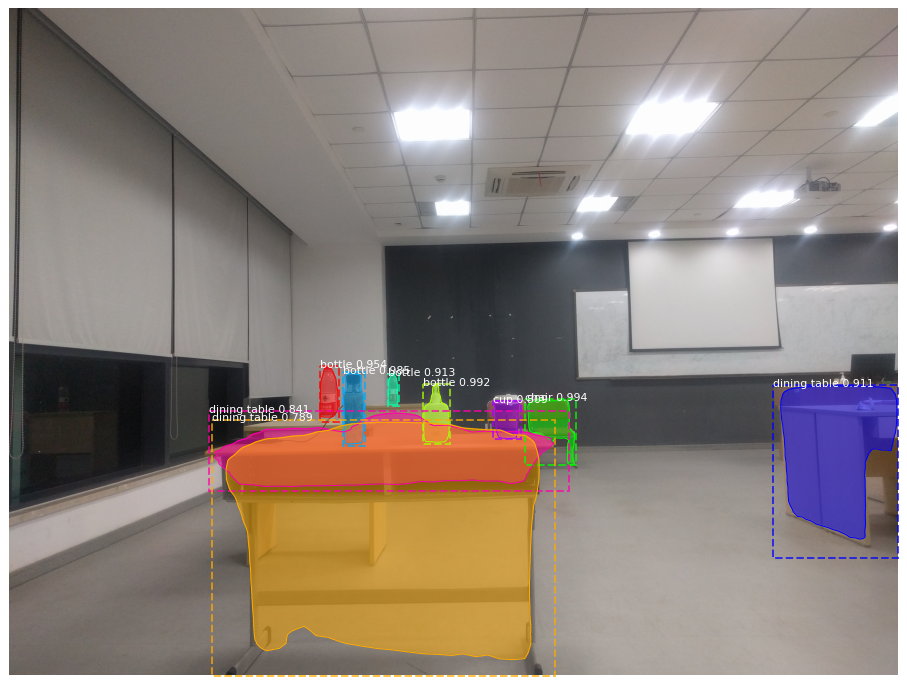

(3024, 4032, 3)
(3024, 4032, 3)
Processing 1 images
image                    shape: (3024, 4032, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 93)               min:    0.00000  max: 4032.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


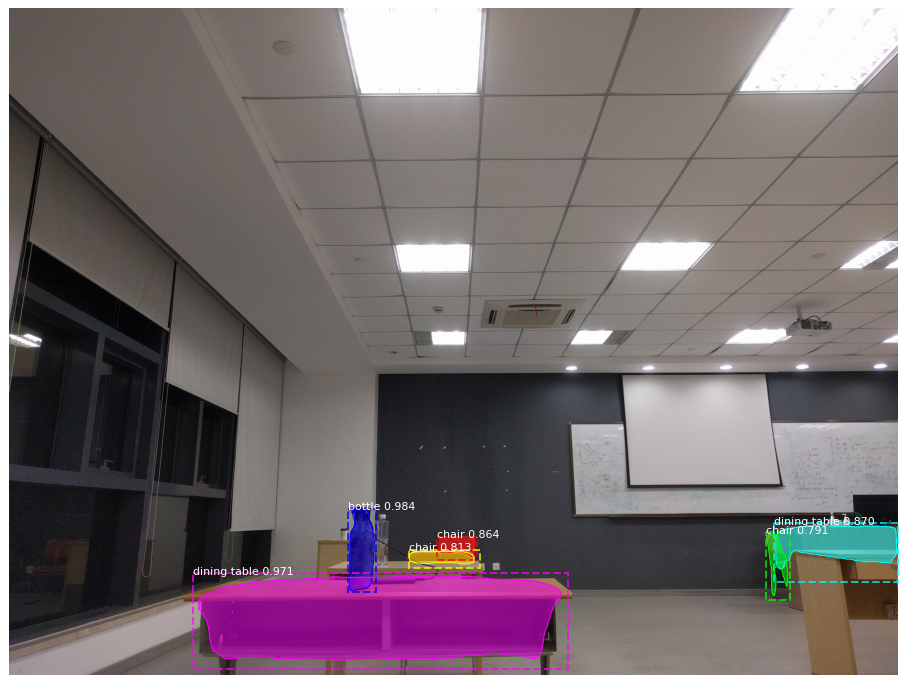

(3024, 4032, 3)
(3024, 4032, 3)
Processing 1 images
image                    shape: (3024, 4032, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 93)               min:    0.00000  max: 4032.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


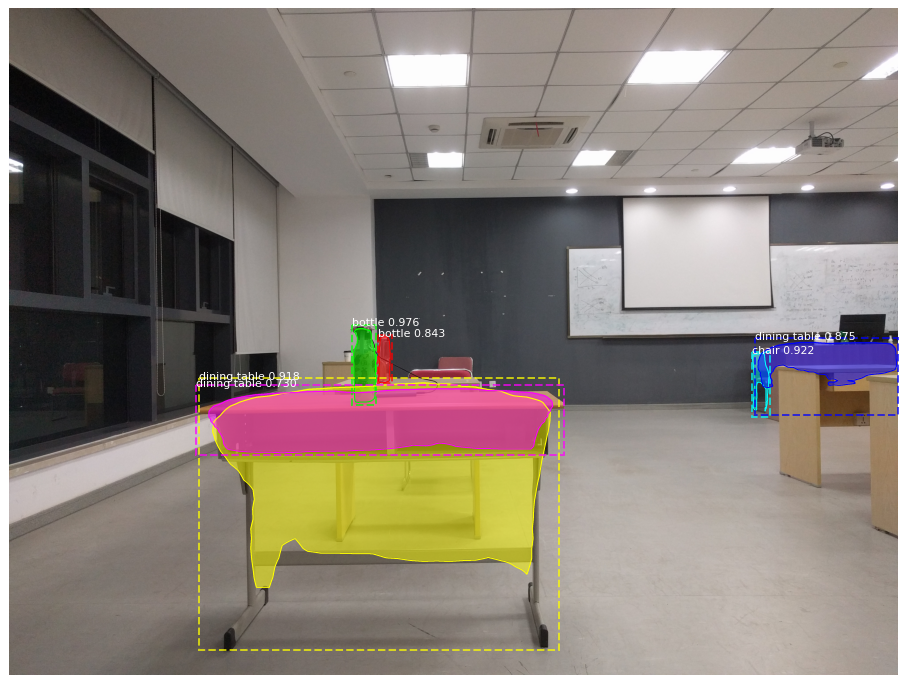

(3024, 4032, 3)
(3024, 4032, 3)
Processing 1 images
image                    shape: (3024, 4032, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 93)               min:    0.00000  max: 4032.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


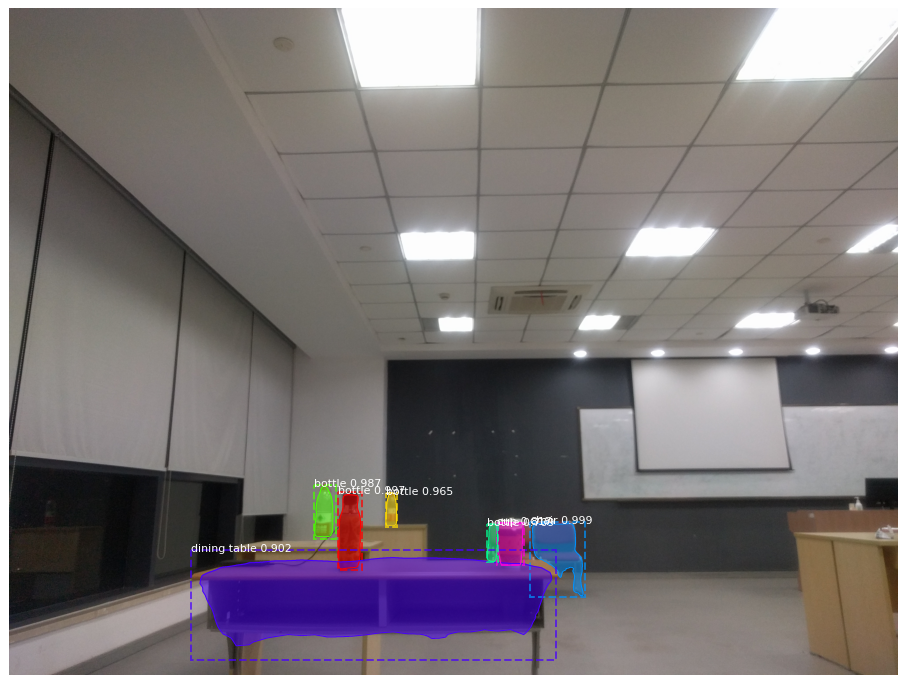

(3024, 4032, 3)
(3024, 4032, 3)
Processing 1 images
image                    shape: (3024, 4032, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 93)               min:    0.00000  max: 4032.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


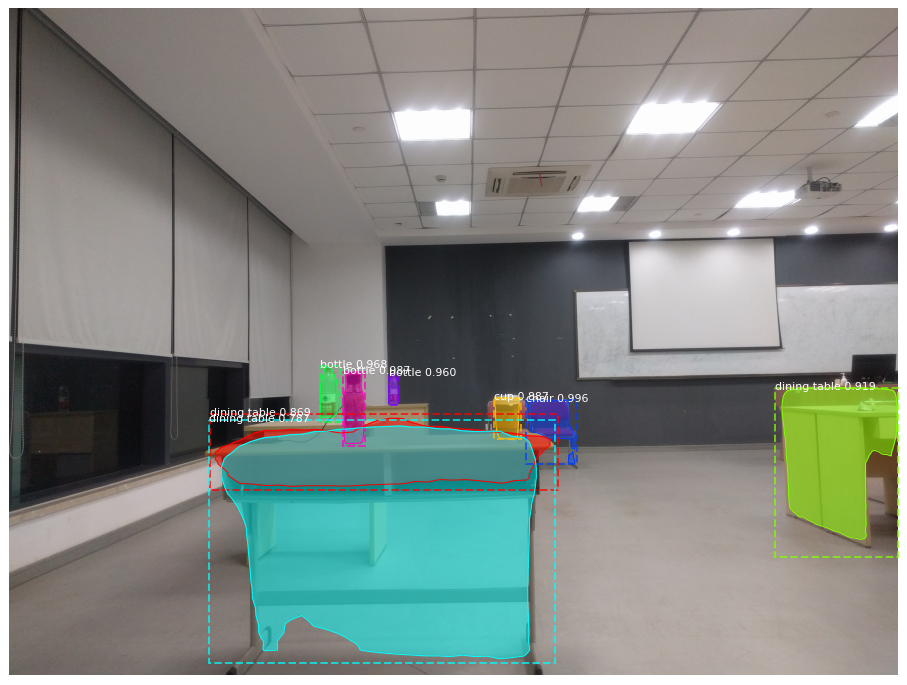

(3024, 4032, 3)
(3024, 4032, 3)
Processing 1 images
image                    shape: (3024, 4032, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 93)               min:    0.00000  max: 4032.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


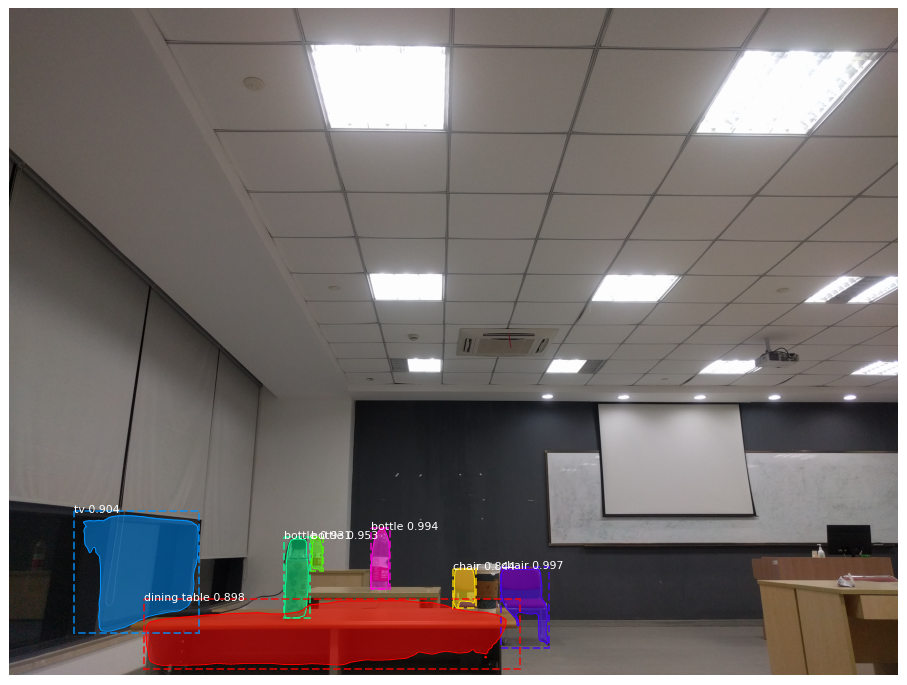

(3024, 4032, 3)
(3024, 4032, 3)
Processing 1 images
image                    shape: (3024, 4032, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 93)               min:    0.00000  max: 4032.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


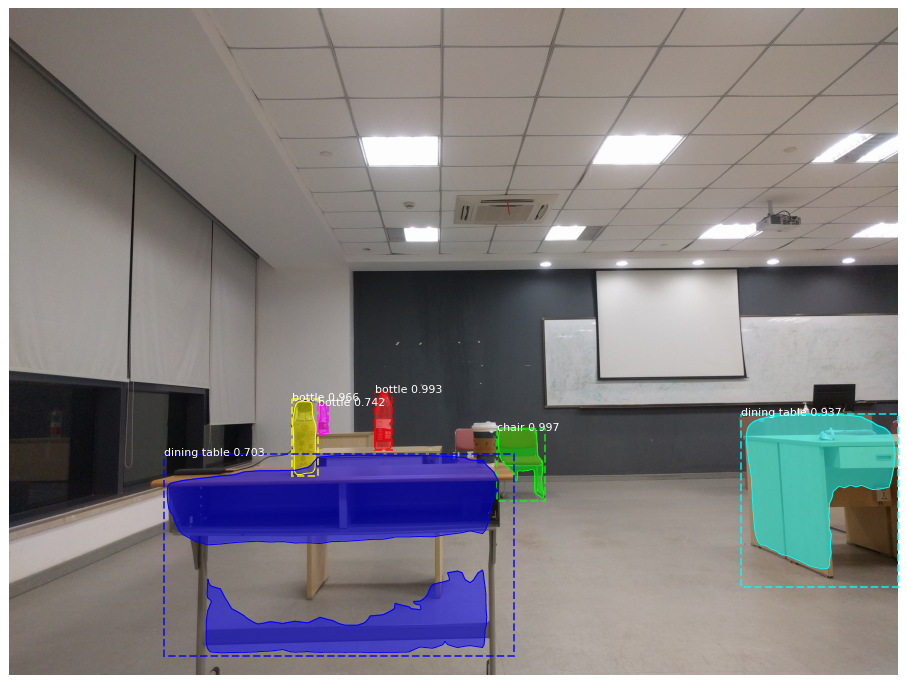

(3024, 4032, 3)
(3024, 4032, 3)
Processing 1 images
image                    shape: (3024, 4032, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 93)               min:    0.00000  max: 4032.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


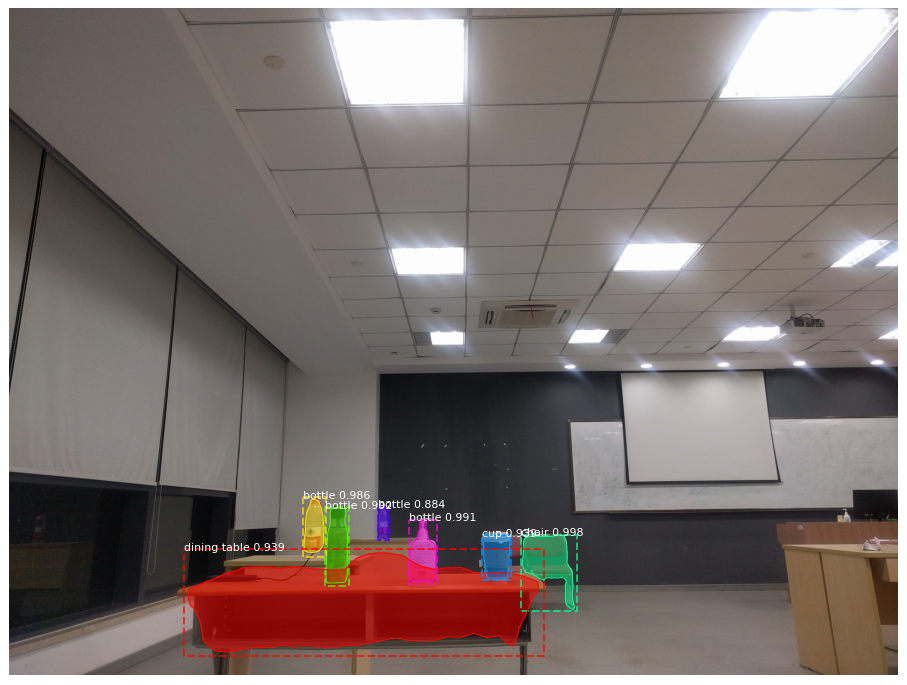

(3024, 4032, 3)
(3024, 4032, 3)
Processing 1 images
image                    shape: (3024, 4032, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 93)               min:    0.00000  max: 4032.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


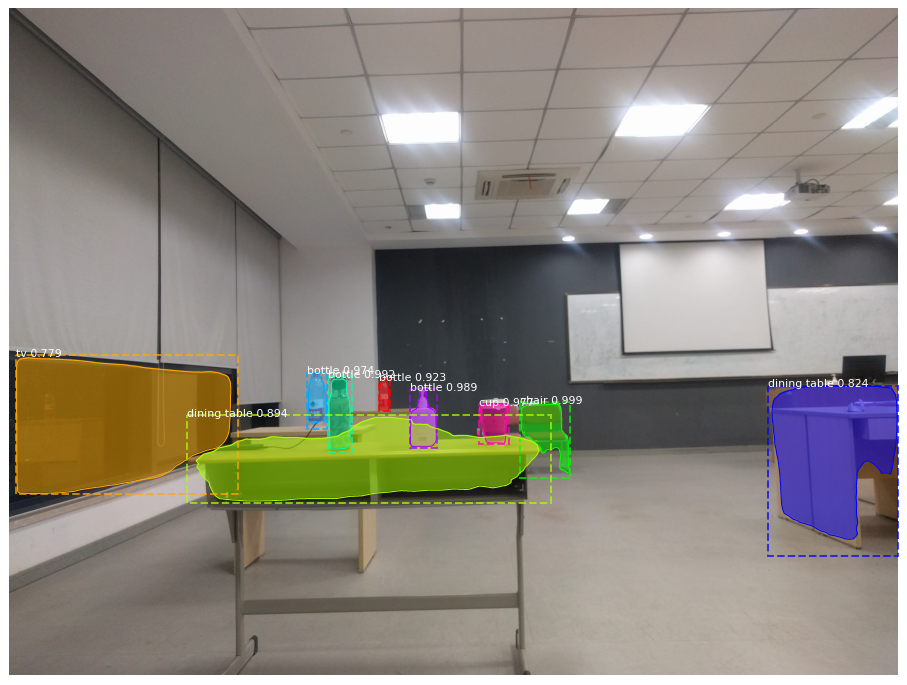

(3024, 4032, 3)
(3024, 4032, 3)
Processing 1 images
image                    shape: (3024, 4032, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 93)               min:    0.00000  max: 4032.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


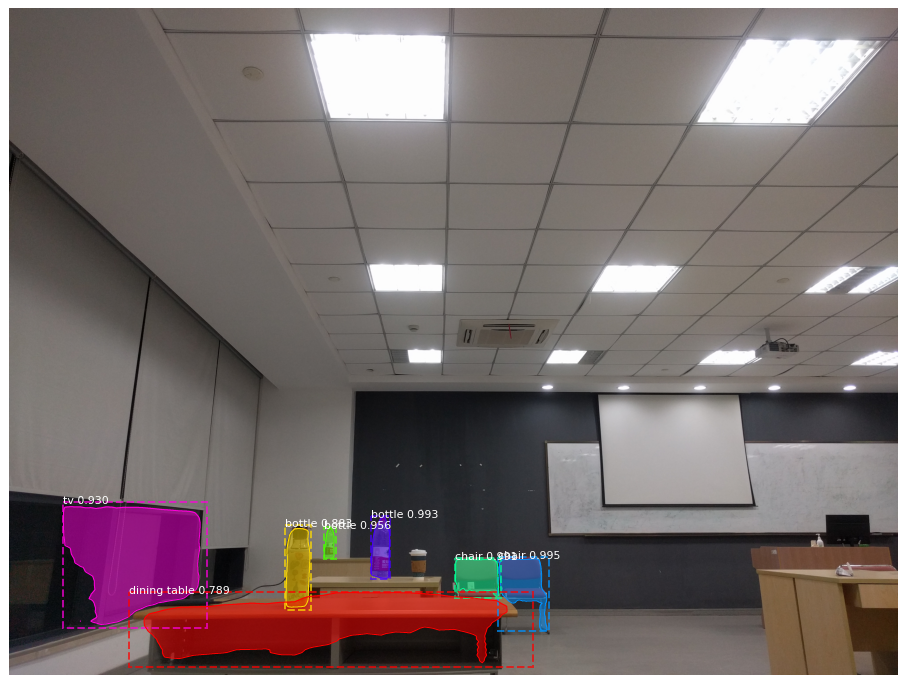

(3024, 4032, 3)
(3024, 4032, 3)
Processing 1 images
image                    shape: (3024, 4032, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 93)               min:    0.00000  max: 4032.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


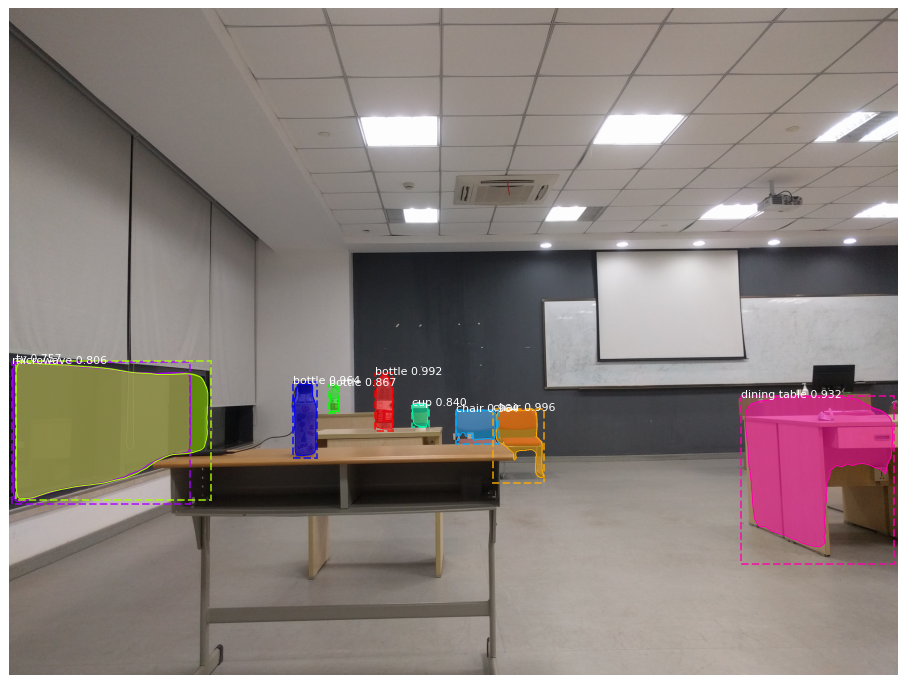

(3024, 4032, 3)
(3024, 4032, 3)
Processing 1 images
image                    shape: (3024, 4032, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 93)               min:    0.00000  max: 4032.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


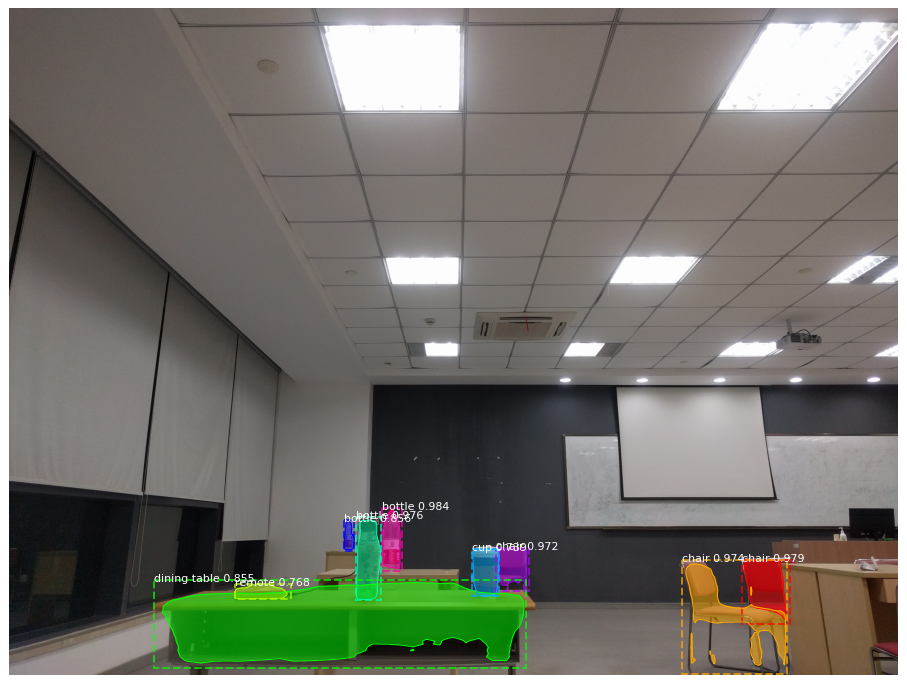

(3024, 4032, 3)
(3024, 4032, 3)
Processing 1 images
image                    shape: (3024, 4032, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 93)               min:    0.00000  max: 4032.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


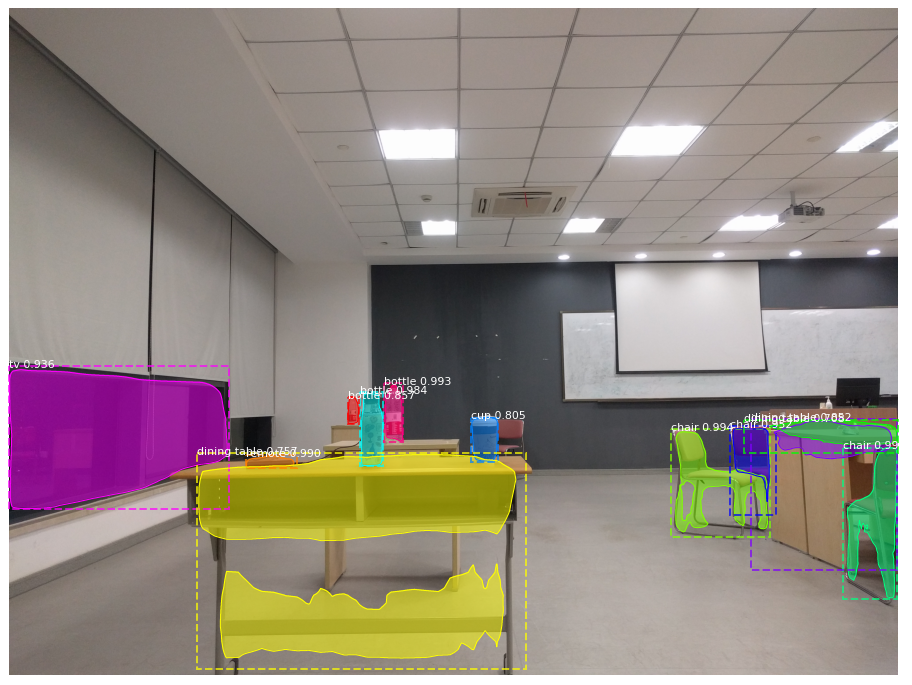

(3024, 4032, 3)
(3024, 4032, 3)
Processing 1 images
image                    shape: (3024, 4032, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 93)               min:    0.00000  max: 4032.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


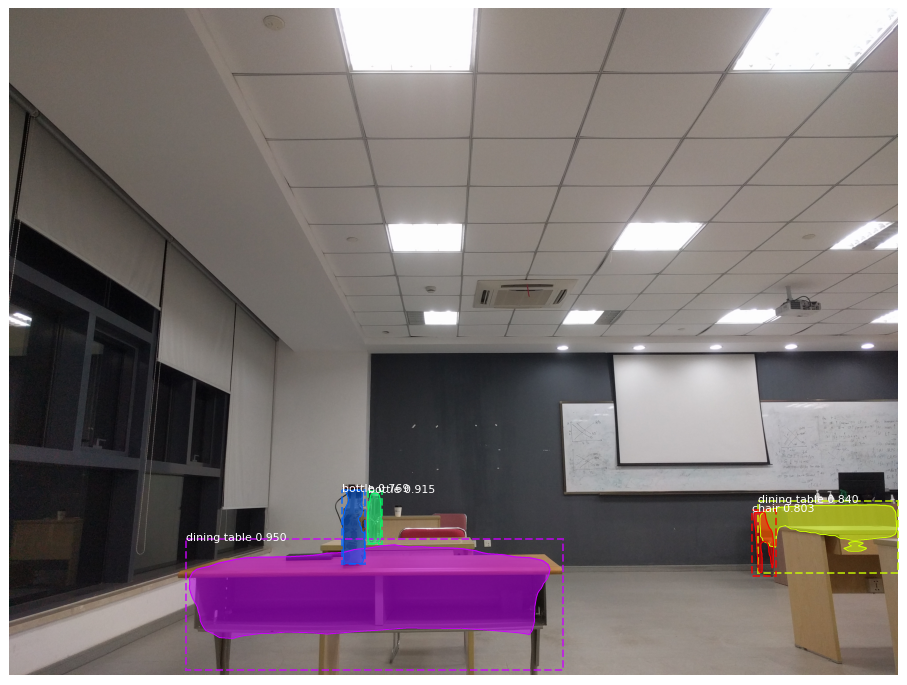

(3024, 4032, 3)
(3024, 4032, 3)
Processing 1 images
image                    shape: (3024, 4032, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 93)               min:    0.00000  max: 4032.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


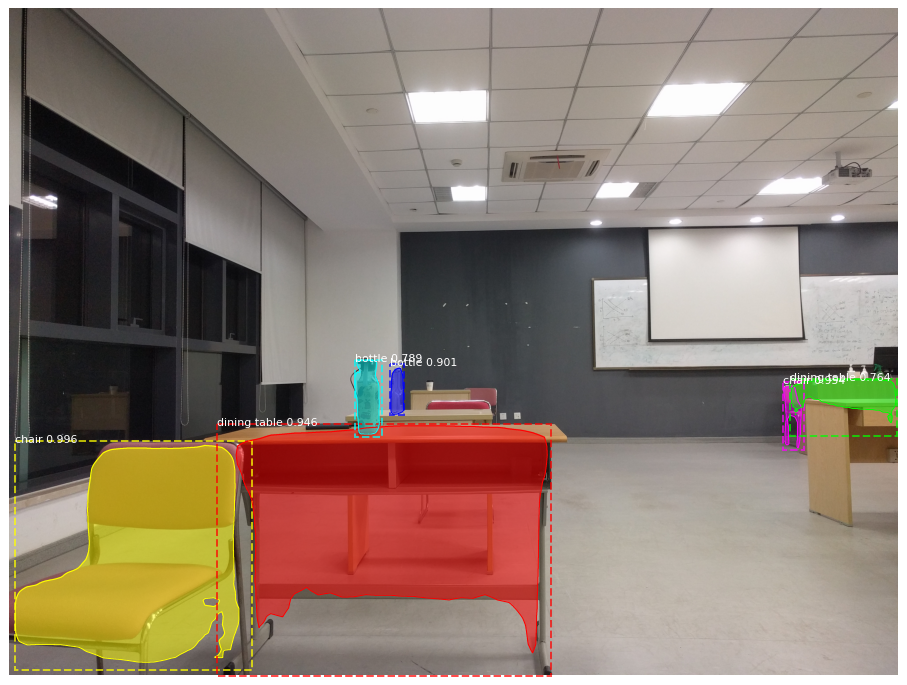

(3024, 4032, 3)
(3024, 4032, 3)
Processing 1 images
image                    shape: (3024, 4032, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 93)               min:    0.00000  max: 4032.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


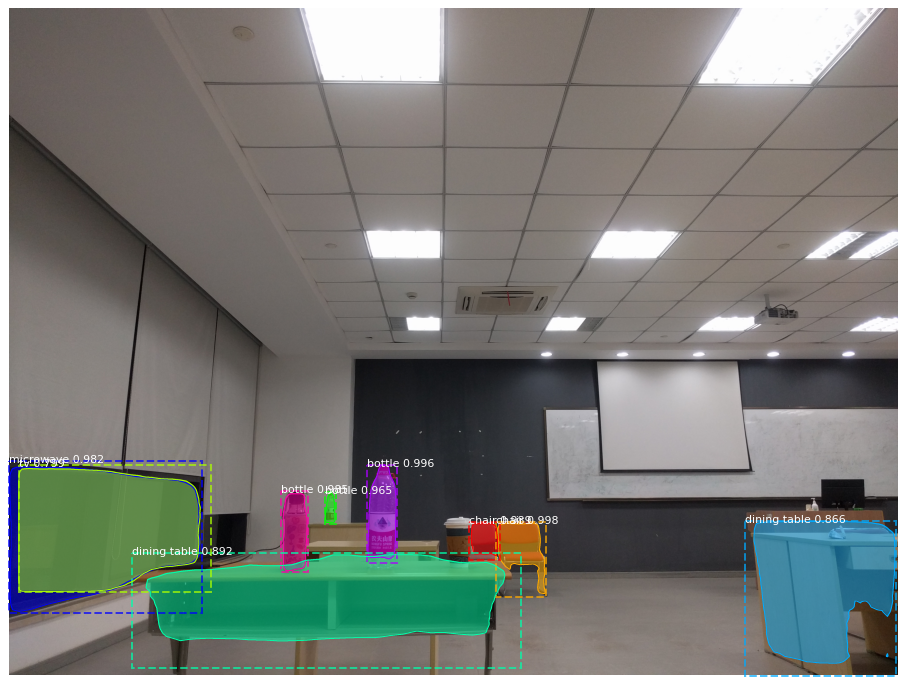

(3024, 4032, 3)
(3024, 4032, 3)
Processing 1 images
image                    shape: (3024, 4032, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 93)               min:    0.00000  max: 4032.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


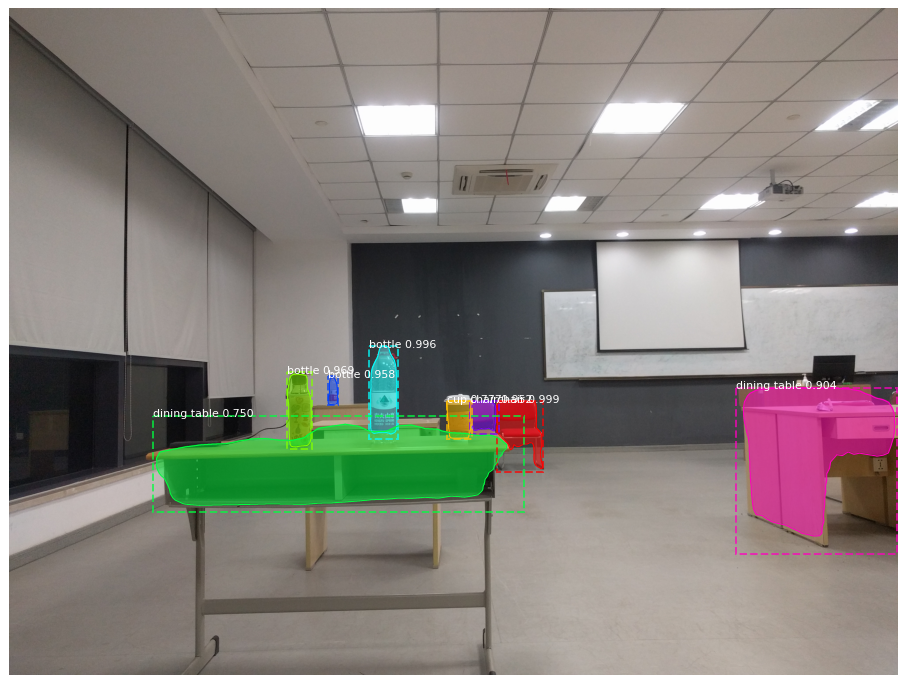

In [ ]:
if not os.path.exists("/content/result/"):
  os.mkdir("/content/result/")
for i in os.listdir("/content/Vision_performance/"):
  in_dir = "/content/Vision_performance/"+i+"/"
  out_dir = "/content/result/"+i+"/"
  if not os.path.exists(out_dir):
    os.mkdir(out_dir)
  draw_mask(in_dir+"example_after.jpg",in_dir+"AoA_position_after.csv",out_dir+"all_after.jpg",out_dir+"final_after.jpg",out_dir+"data_after")
  draw_mask(in_dir+"example_before.jpg",in_dir+"AoA_position_before.csv",out_dir+"all_before.jpg",out_dir+"final_before.jpg",out_dir+"data_before")

In [ ]:
!cp /content/result/ -r /content/drive/MyDrive/data/Mark_result


[[1709 2279]
 [1596 2167]
 [1596 2167]
 ...
 [1473 2065]
 [1478 2146]
 [1478 2146]]
Processing 1 images
image                    shape: (3024, 4032, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 93)               min:    0.00000  max: 4032.00000  float64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32


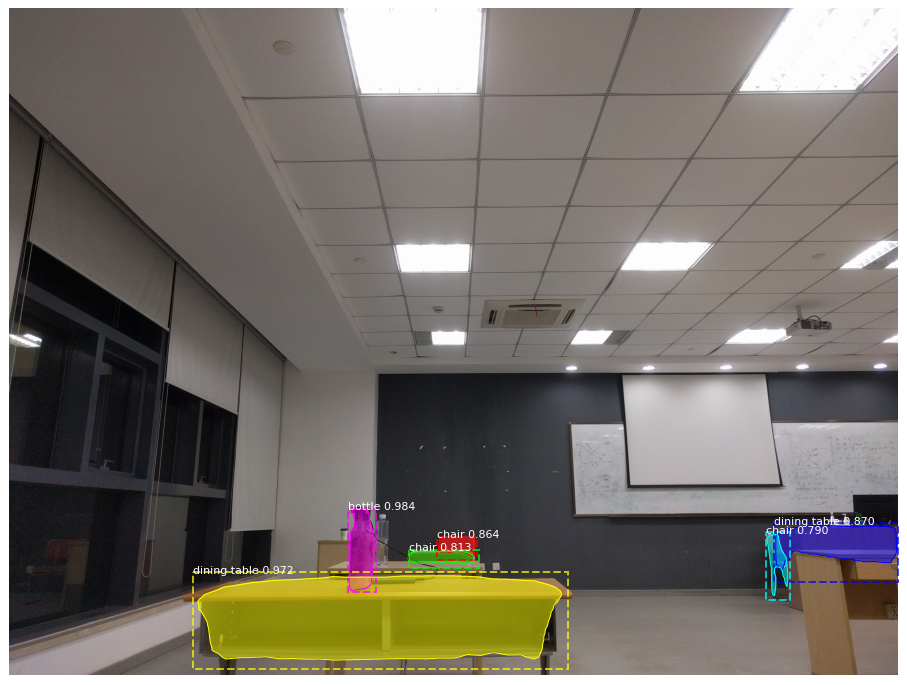

[0.9838472  0.9716647  0.8702338  0.86352456 0.81284773 0.78974724]
0


In [ ]:
# img_dir = "/content/example1_before.jpg"
# AoA_dir = "/content/AoA_position_before.csv"
img_dir = "/content/example2_after.jpg"
AoA_dir = "/content/AoA_position_after.csv"
image = skimage.io.imread(img_dir)

positions = np.loadtxt(AoA_dir, delimiter=',').astype(int)
print(positions)
results = model.detect([image], verbose=1)
r = results[0]
visualize.display_instances(image, r['rois'], r['masks'], r['class_ids'], class_names, r['scores'])

import cv2
img1 = cv2.imread(img_dir)
# dye_mask(img1,results,positions,"example1_before_Mask.jpg")
dye_mask(img1,results,positions,"example2_after_Mask.jpg")
